# <font color='orange'>Unsupervised Clustering of Scientific Abstracts from Cornell's ARXIV database


# <font color='blue'>TOC:
## <font color='blue'>0. Loading large data and Computing Parallelly on PC with Dask
## <font color='blue'>1. Data-cleaning and feature engineering
## <font color='blue'>2. Spacy Tokenizer, Stopwords, Punctuations
## <font color='blue'>3. Vectorization and dimensionality reduction
## <font color='blue'>4. K-means
## <font color='blue'>5. t-SNE vs umap 
## <font color='blue'>6. K-means
## <font color='blue'>7. Interactive mapping
## <font color='blue'>8. Choose a different k

# 0. Loading large data and Computing Parallelly on PC with Dask

In [1]:
import logging
logger = logging.getLogger("spacy")
logger.setLevel(logging.ERROR)

import dask.bag as db
import json
import pandas as pd

docs = db.read_text('../input/arxiv/arxiv-metadata-oai-snapshot.json').map(json.loads)

## Total number of documents: 


In [2]:
docs.count().compute()

2182279

## Looking at individual documents:


In [3]:
docs.take(5)

({'id': '0704.0001',
  'submitter': 'Pavel Nadolsky',
  'authors': "C. Bal\\'azs, E. L. Berger, P. M. Nadolsky, C.-P. Yuan",
  'title': 'Calculation of prompt diphoton production cross sections at Tevatron and\n  LHC energies',
  'comments': '37 pages, 15 figures; published version',
  'journal-ref': 'Phys.Rev.D76:013009,2007',
  'doi': '10.1103/PhysRevD.76.013009',
  'report-no': 'ANL-HEP-PR-07-12',
  'categories': 'hep-ph',
  'license': None,
  'abstract': '  A fully differential calculation in perturbative quantum chromodynamics is\npresented for the production of massive photon pairs at hadron colliders. All\nnext-to-leading order perturbative contributions from quark-antiquark,\ngluon-(anti)quark, and gluon-gluon subprocesses are included, as well as\nall-orders resummation of initial-state gluon radiation valid at\nnext-to-next-to-leading logarithmic accuracy. The region of phase space is\nspecified in which the calculation is most reliable. Good agreement is\ndemonstrated with d

## get a subset 


In [4]:


get_latest_version = lambda x: x['versions'][-1]['created']


# get a subset 
trim = lambda x: {'id': x['id'],
                  'authors': x['authors'],
                  'title': x['title'],
                  'doi': x['doi'],
                  'category':x['categories'].split(' '),
                  'abstract':x['abstract'],}


# filter by time
columns = ['id','category','abstract']
docs_df = (docs.filter(lambda x: int(get_latest_version(x).split(' ')[3]) > 2018)
           .map(trim).
           compute())

docs_df = pd.DataFrame(docs_df)

In [5]:
docs_df.to_csv("trimmed_arxiv_docs.csv", index=False)

In [6]:
docs_df.tail()

,id,authors,title,doi,category,abstract
747203,quant-ph/0612050,"Igor Devetak, Jon Yard",The exact cost of redistributing multipartite ...,10.1103/PhysRevLett.100.230501,[quant-ph],How correlated are two quantum systems from ...
747204,quant-ph/0701163,Daegene Song,Thermodynamics of Quantum Measurement,None,[quant-ph],Von Neumann's quantum measurement protocol i...
747205,quant-ph/0702160,"Andrew M. Childs, Richard Cleve, Stephen P. Jo...",Discrete-query quantum algorithm for NAND trees,10.4086/toc.2009.v005a005,[quant-ph],"Recently, Farhi, Goldstone, and Gutmann gave..."
747206,quant-ph/9606017,Arthur Jabs,Quantum Mechanics in Terms of Realism,None,[quant-ph],.We expound an alternative to the Copenhagen...
747207,quant-ph/9806088,"J. Eisert, M. Wilkens, and M. Lewenstein",Quantum Games and Quantum Strategies,10.1103/PhysRevLett.83.3077,[quant-ph],We investigate the quantization of non-zero ...


# 1.Data-cleaning and feature engineering

In [7]:
df = pd.read_csv("./trimmed_arxiv_docs.csv")

/opt/conda/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 747208 entries, 0 to 747207
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   id        747208 non-null  object
 1   authors   747208 non-null  object
 2   title     747208 non-null  object
 3   doi       265981 non-null  object
 4   category  747208 non-null  object
 5   abstract  747208 non-null  object
dtypes: object(6)
memory usage: 34.2+ MB


# word counts of each abstract


In [9]:
df['abstract_word_count'] = docs_df['abstract'].apply(lambda x: len(x.strip().split())) 

In [10]:
df['abstract'].describe(include='all')

count                                                747208
unique                                               747067
top         arXiv admin note: This submission has been w...
freq                                                      3
Name: abstract, dtype: object

## remove duplicated abstracts


In [11]:
df.drop_duplicates(['abstract',], inplace=True)
df['abstract'].describe(include='all')

count                                                747067
unique                                               747067
top         Let $\mathcal{G}^{(\lambda)}$ be a group sch...
freq                                                      1
Name: abstract, dtype: object

# 2. Spacy Tokenizer, Stopwords, Punctuations

## look at 10000 rows

In [12]:
df = df.sample(10000, random_state=42)

# tqdm is a library used for creating Progress Bars, and en_core_sci_lg is for scientific text 

In [13]:
from tqdm import tqdm
from IPython.utils import io
with io.capture_output() as captured:
    !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.4.0/en_core_sci_lg-0.4.0.tar.gz

# spaCy is an open-source software library for advanced natural language processing

In [14]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS  
import en_core_sci_lg   

# Define a Parser Function


In [15]:
parser = en_core_sci_lg.load()
parser.max_length = 7000000 #Limit the size of the parser

def spacy_tokenizer(sentence):
    ''' Function to preprocess text of scientific papers 
        (e.g Removing Stopword and puntuations)'''
    mytokens = parser(sentence)
    mytokens = [ word.lemma_.lower().strip() if word.lemma_ != "-PRON-" else word.lower_ for word in mytokens ] # transform to lowercase and then split the scentence
    mytokens = [ word for word in mytokens if word not in stopwords and word not in punctuations ] #remove stopsword an punctuation
    mytokens = " ".join([i for i in mytokens]) 
    return mytokens

# list of punctuation to remove 

In [16]:
import string

punctuations = string.punctuation 
stopwords = list(STOP_WORDS)
stopwords[:10]

['every',
 'along',
 'her',
 'been',
 'whence',
 'namely',
 'off',
 'those',
 'nowhere',
 'are']

# 

In [17]:
tqdm.pandas()
df["processed_text"] = df["abstract"].progress_apply(spacy_tokenizer)

100%|██████████| 10000/10000 [08:07<00:00, 20.52it/s]


# 3. Vectorization and dimensionality reduction 

In [18]:
# Import vectorizer and define vec function
from sklearn.feature_extraction.text import TfidfVectorizer
def vectorize(text, maxx_features):
    
    vectorizer = TfidfVectorizer(max_features=maxx_features)
    X = vectorizer.fit_transform(text)
    return X

In [19]:
#vectorize each processed abstract
text = df['processed_text'].values
X = vectorize(text, 2 ** 12) #arbitrary max feature -_> Hyperpara. for optimisation (?)
X.shape

(10000, 4096)

In [20]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95, random_state=42) #Keep 95% of the variance
X_reduced= pca.fit_transform(X.toarray())
X_reduced.shape

(10000, 2801)

# 4. Kmeans for Clustering and Choose k from elbow plot

In [21]:
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from scipy.spatial.distance import cdist
from sklearn import metrics

r_seed = 14
cluster_errors = []

for i in range(1, 50):
    n_clusters = i
    pipe_pca_kmean = Pipeline([("cluster", KMeans(n_clusters=n_clusters, random_state=r_seed, verbose=0))])#, n_jobs=1))])

    pipe_pca_kmean.fit(X_reduced)
    pipe_pca_kmean.predict(X_reduced)
    cluster_errors.append(pipe_pca_kmean.named_steps["cluster"].inertia_) 

plt.clf()
plt.plot(cluster_errors, "o-")
plt.xlabel("k_clusters")
plt.ylabel("sum sq distances from mean")
plt.show()

In [24]:
k = 20 
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(X_reduced)
df['kmean_clusters'] = y_pred

# 5. t-SNE vs umap

In [25]:
!pip install umap-learn

In [26]:
from umap import UMAP

In [27]:
# UMAP Definition:
umap_embeddings = UMAP(n_neighbors=100, min_dist=0.3, n_components=2)

In [28]:
X_umap = umap_embeddings.fit_transform(X_reduced)

In [29]:
from sklearn.manifold import TSNE

tsne = TSNE(verbose=1, perplexity=100, random_state=42)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.033s...
[t-SNE] Computed neighbors for 10000 samples in 9.264s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.315505
[t-SNE] KL divergence after 50 iterations with early exaggeration: 83.335022
[t-SNE] KL divergence after 1000 iterations: 2.577638


## UMAP: Uniform Manifold Approximation and Projection 

* t-SNE and UMAP are both for data visualization. They are not meant to tell you about clustering or variation as much as methods like PCA do. 
* t-SNE and UMAP have the same principle and workflow: create a high dimensional graph, then reconstruct it in a lower dimensional space while retaining the structure.
### * t-SNE moves the high dimensional graph to a lower dimensional space points by points. UMAP compresses that graph.
* Key parameters for t-SNE and UMAP are the perplexity and number of neighbors, respectively. 
* UMAP is more time-saving due to the clever solution in creating a rough estimation of the high dimensional graph instead of measuring every point.
* UMAP gives a better balance between local versus global structure, thus overall gives a more accurate presentation of the global structure. This will come in handy in trajectory analysis. 

https://blog.bioturing.com/2022/01/14/umap-vs-t-sne-single-cell-rna-seq-data-visualization/#:~:text=t-SNE%20and%20UMAP%20have,UMAP%20compresses%20that%20graph.

# Before K-means: t-SNE vs Umap

<AxesSubplot:>

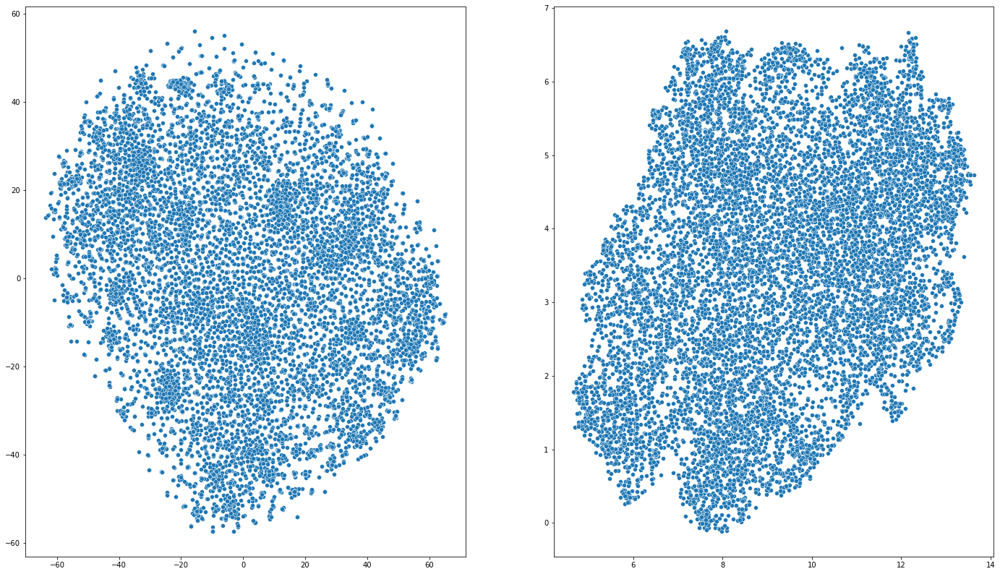

In [30]:
import seaborn as sns
fig,ax=plt.subplots(1,2,figsize=(24,14))
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], ax=ax[0])
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], ax=ax[1])

# 6. Kmeans: t-SNE vs Umap 

<AxesSubplot:>

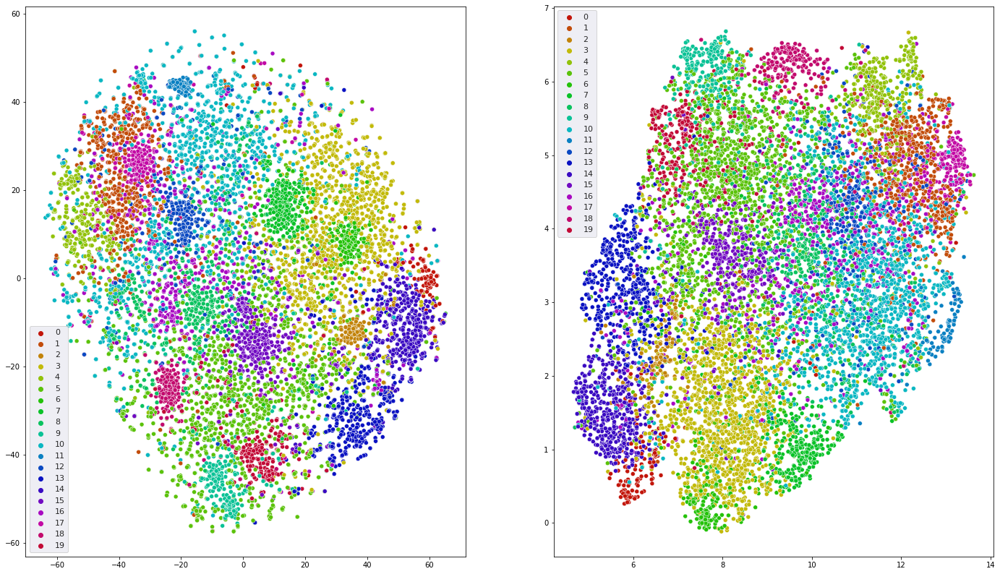

In [31]:
%matplotlib inline
fig,ax=plt.subplots(1,2,figsize=(24,14))

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(20, l=.4, s=.9)
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=y_pred, legend='full', ax=ax[0], palette=palette)

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(20, l=.4, s=.9)
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=y_pred, legend='full', ax=ax[1], palette=palette)



# 7. Interactive mapping: t-SNE vs UMap

In [32]:
import plotly.express as px


fig = px.scatter(df, x=X_embedded[:,0], y=X_embedded[:,1], color=y_pred.astype(str),
                 hover_data=['id', 'authors', 'title',],
                 height= 1000, width=1000,
                title = "t-SNE with Kmeans (interactive)")
fig.show()


## For example, Color 14 for Astrophysics, Color 7 for Quantum

In [33]:
fig = px.scatter(df, x=X_umap[:,0], y=X_umap[:,1], color=y_pred.astype(str),
                 hover_data=['id', 'authors', 'title',],
                 height= 1000, width=1000,
                title = "Umap with Kmeans (interactive)")
fig.show()

# 8. Choose a different k, n_neighbors for Umap, and perplexity for t-SNE

n_neighbors: balances between local versus global structure by constraining the size of the local neighborhood in the manifold structure

perplexity:  attention balance between local and global aspects by guessing the number of close neighbors; calculated from the number of cells according to the power law  ~ N^(1/2); provide the largest distance between ~100 units.

There is a UMAP parameter called n_component, which is the dimension in output (1D, 2D, etc.). https://umap-learn.readthedocs.io/en/latest/parameters.html#n-components

UMAP is not like PCA in terms of n_components: In fact, all the initial dimensions (=initial data having m features) are projected to a lower-dimensional space (=n components).

The UMAP axes don't have the same meaning as the PCA axes: UMAP represents a relative space of probabilities, whereas PCA axes represent the main features' abundance of variation.

As a consequence, you just have to choose n_components based on data complexity and volume.

https://datascience.stackexchange.com/questions/112389/how-to-fine-tune-n-components-parameter-in-umap
https://towardsdatascience.com/how-to-tune-hyperparameters-of-tsne-7c0596a18868
https://umap-learn.readthedocs.io/en/latest/


In [37]:
k = 25 
kmeans = KMeans(n_clusters=k, random_state=14)
y_pred = kmeans.fit_predict(X_reduced)
df['kmean_clusters'] = y_pred

umap_embeddings = UMAP(n_neighbors=100, min_dist=0.3, n_components=2) 
X_umap = umap_embeddings.fit_transform(X_reduced)

tsne = TSNE(verbose=1, perplexity=100, random_state=14)
X_embedded = tsne.fit_transform(X.toarray())



[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.036s...
[t-SNE] Computed neighbors for 10000 samples in 9.413s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.315505
[t-SNE] KL divergence after 50 iterations with early exaggeration: 83.335022
[t-SNE] KL divergence after 1000 iterations: 2.581850


<AxesSubplot:>

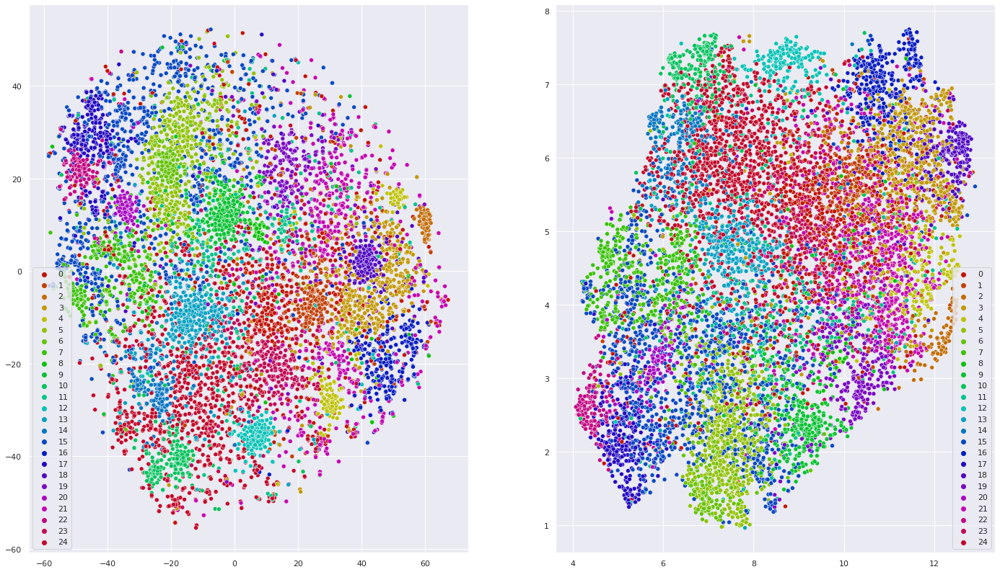

In [38]:
##### plot

fig,ax=plt.subplots(1,2,figsize=(24,14))

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=y_pred, legend='full', ax=ax[0], palette=palette)

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=y_pred, legend='full', ax=ax[1], palette=palette)

In [39]:

k = 15 

umap_embeddings = UMAP(n_neighbors=150, min_dist=0.3, n_components=2) 
X_umap = umap_embeddings.fit_transform(X_reduced)

tsne = TSNE(verbose=1, perplexity=150, random_state=14)
X_embedded = tsne.fit_transform(X.toarray())




[t-SNE] Computing 451 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.036s...
[t-SNE] Computed neighbors for 10000 samples in 9.778s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.318948
[t-SNE] KL divergence after 50 iterations with early exaggeration: 78.454567
[t-SNE] KL divergence after 1000 iterations: 2.476652


<AxesSubplot:>

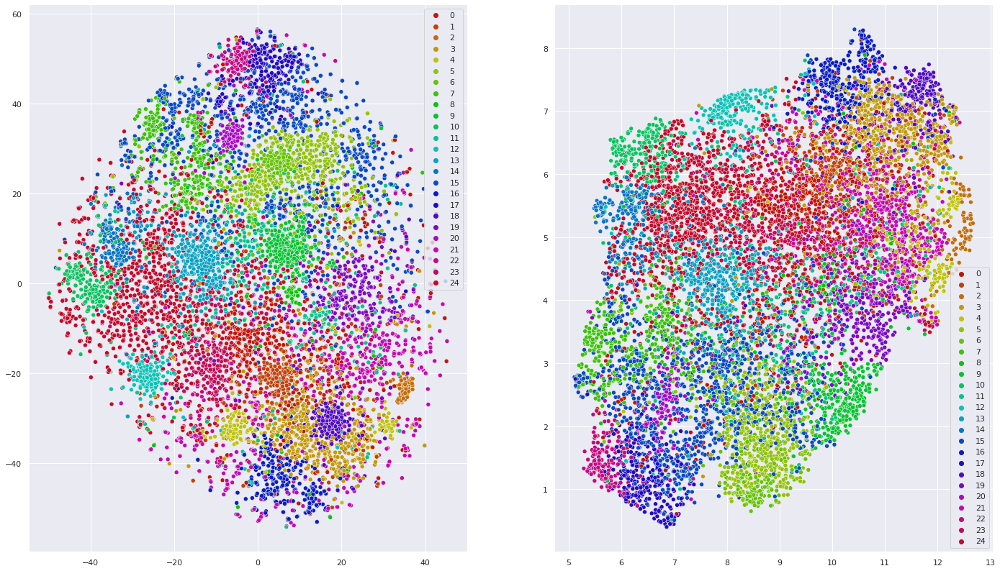

In [42]:

fig,ax=plt.subplots(1,2,figsize=(24,14))

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=y_pred, legend='full', ax=ax[0], palette=palette)

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=y_pred, legend='full', ax=ax[1], palette=palette)

In [43]:
k = 25 
kmeans = KMeans(n_clusters=k, random_state=14)
y_pred = kmeans.fit_predict(X_reduced)
df['kmean_clusters'] = y_pred

umap_embeddings = UMAP(n_neighbors=100, min_dist=0.3, n_components=3) 
X_umap = umap_embeddings.fit_transform(X_reduced)

tsne = TSNE(verbose=1, perplexity=100, random_state=14, n_components=3)
X_embedded = tsne.fit_transform(X.toarray())

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.034s...
[t-SNE] Computed neighbors for 10000 samples in 9.907s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.315505
[t-SNE] KL divergence after 50 iterations with early exaggeration: 83.335022
[t-SNE] KL divergence after 850 iterations: 2.525981


<AxesSubplot:>

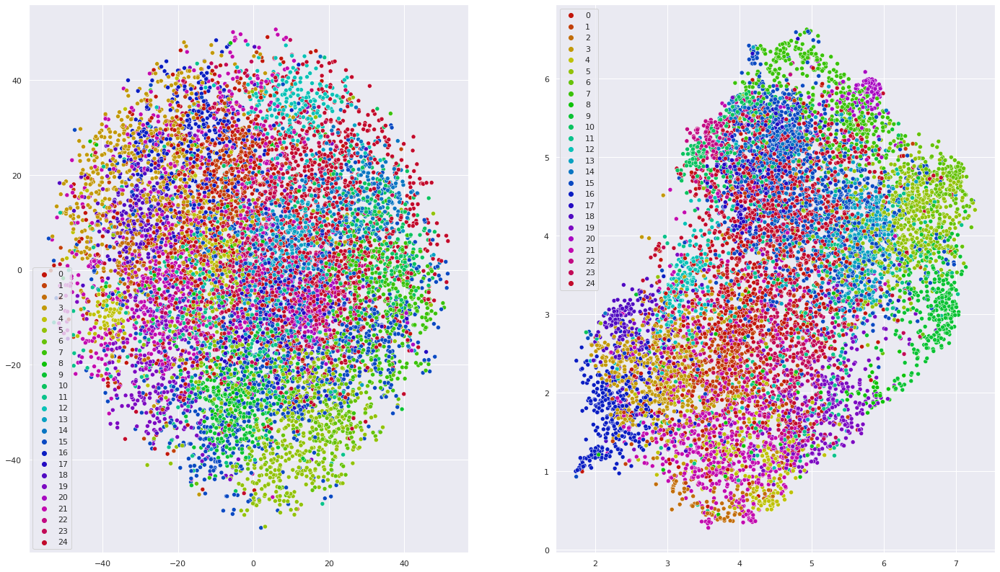

In [44]:
fig,ax=plt.subplots(1,2,figsize=(24,14))

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_embedded[:,0], y=X_embedded[:,1], hue=y_pred, legend='full', ax=ax[0], palette=palette)

sns.set(rc={'figure.figsize':(15,15)})
palette = sns.hls_palette(25, l=.4, s=.9)
sns.scatterplot(x=X_umap[:,0], y=X_umap[:,1], hue=y_pred, legend='full', ax=ax[1], palette=palette)

# References:
https://www.kaggle.com/code/maksimeren/arxiv-literature-clustering
https://www.kaggle.com/code/onyonixch/scientific-paper-clustering